#### SDK 클론 및 패키지 설치

In [50]:
# ============================================================
# RobotCar Dataset SDK 다운로드 + 기본 라이브러리 설치
#    - /content 아래에 SDK를 클론
#    - 이미 클론되어 있으면 클론 X
# ============================================================

%cd /content

import os

SDK_REPO = "https://github.com/ori-mrg/robotcar-dataset-sdk.git"
SDK_DIR = "/content/robotcar-dataset-sdk"

# (1) SDK 클론 (중복 방지)
if not os.path.exists(SDK_DIR):
    !git clone {SDK_REPO}
else:
    print(f"[SKIP] SDK already exists: {SDK_DIR}")

# (2) 기본 패키지 설치
!pip -q install numpy opencv-python matplotlib pandas


/content
[SKIP] SDK already exists: /content/robotcar-dataset-sdk


#### Google Drive 마운트

In [51]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### 데이터 루트 경로 설정 및 디렉터리 구조 확인

In [52]:
DATA_ROOT = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"

In [53]:
# (A) 최상위만 간단히
!ls -al "{DATA_ROOT}" | head -n 50

# (B) 2~3 depth 정도만 30줄 보기
!find "{DATA_ROOT}" -maxdepth 3 -type d | head -n 30

total 542
drwx------ 2 root root   4096 Jan 10 15:23 gps
drwx------ 2 root root   4096 Jan 10 15:23 gt
drwx------ 2 root root   4096 Jan 10 15:23 lms_front
-rw------- 1 root root 118693 Jan 10 14:58 lms_front.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 lms_rear
-rw------- 1 root root 119168 Jan 10 14:58 lms_rear.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 mono_left
-rw------- 1 root root  40565 Jan 10 14:58 mono_left.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 mono_rear
-rw------- 1 root root  40565 Jan 10 14:58 mono_rear.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 mono_right
-rw------- 1 root root  40565 Jan 10 14:58 mono_right.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 radar
-rw------- 1 root root   9538 Jan 10 14:58 radar.timestamps
drwx------ 5 root root   4096 Jan 10 15:23 stereo
-rw------- 1 root root  38171 Jan 10 14:58 stereo.timestamps
drwx------ 2 root root   4096 Jan 10 15:23 velodyne_left
-rw------- 1 root root  47785 Jan 1

#### 타임스탬프 처리용 공통 유틸리티 정의

In [54]:
!find "{DATA_ROOT}" -name "*.timestamps" | head -n 50

/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/velodyne_left.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/lms_rear.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/mono_rear.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/velodyne_right.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/lms_front.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/mono_left.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/stereo.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/radar.timestamps
/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample/mono_right.timestamps


In [55]:
# ============================================================
# timestamps 유틸리티
#    - load_timestamps: *.timestamps 파일에서 ts 목록을 읽어옴
#    - nearest_ts: 쿼리 시각 t_query에 가장 가까운 timestamp를 선택
# ============================================================

import os
import numpy as np

def load_timestamps(ts_path: str) -> np.ndarray:
    """timestamps 파일에서 첫 컬럼(timestamp)을 int64 배열로 로드"""
    ts = []
    with open(ts_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            # 일반적으로 첫 컬럼이 timestamp(ns)
            ts.append(int(line.split()[0]))
    return np.array(ts, dtype=np.int64)

def nearest_ts(ts_array: np.ndarray, t: int) -> int:
    """정렬된 ts_array에서 t에 가장 가까운 timestamp를 반환"""
    idx = np.searchsorted(ts_array, t)
    if idx == 0:
        return int(ts_array[0])
    if idx >= len(ts_array):
        return int(ts_array[-1])

    before, after = ts_array[idx - 1], ts_array[idx]
    return int(before if abs(t - before) <= abs(after - t) else after)

#### Oxford Radar RobotCar SDK 모듈 로드

In [56]:
# ============================================================
# RobotCar SDK 파이썬 모듈 로드
#    - SDK의 python 경로를 sys.path에 추가한 뒤 radar/velodyne 모듈을 import
# ============================================================

import sys
import os

SDK_ROOT = "/content/robotcar-dataset-sdk/python"

print("SDK exists:", os.path.exists(SDK_ROOT))
if os.path.exists(SDK_ROOT):
    print("Files in SDK python dir:", os.listdir(SDK_ROOT))

if SDK_ROOT not in sys.path:
    sys.path.insert(0, SDK_ROOT)

# SDK 모듈 import
import radar
import velodyne

print("radar module:", radar)
print("velodyne module:", velodyne)

SDK exists: True
Files in SDK python dir: ['__init__.py', 'README.md', 'requirements.txt', 'play_images.py', 'project_laser_into_camera.py', 'radar.py', 'build_pointcloud.py', 'play_velodyne.py', '__pycache__', 'image.py', 'velodyne.py', '.gitignore', 'road_boundary.py', 'play_road_boundary.py', 'transform.py', 'interpolate_poses.py', 'play_radar.py', 'camera_model.py']
radar module: <module 'radar' from '/content/robotcar-dataset-sdk/python/radar.py'>
velodyne module: <module 'velodyne' from '/content/robotcar-dataset-sdk/python/velodyne.py'>


In [57]:
!ls /content/robotcar-dataset-sdk/python

build_pointcloud.py   play_radar.py		    README.md
camera_model.py       play_road_boundary.py	    requirements.txt
image.py	      play_velodyne.py		    road_boundary.py
__init__.py	      project_laser_into_camera.py  transform.py
interpolate_poses.py  __pycache__		    velodyne.py
play_images.py	      radar.py


#### 프레임 단위 데이터 로딩 함수 정의

In [58]:
# ============================================================
# 센서 프레임 로더: Query timestamp(t_query)에 가장 가까운
#          Stereo / Radar / LiDAR 데이터를 로드하여 하나의 dict로 반환
# ============================================================

import os
import cv2
import glob

def get_frame(DATA_ROOT, t_query,
              cart_res=0.25,
              cart_pixel_width=600):
    """
    특정 시각(t_query)을 기준으로, 가장 가까운 센서 타임스탬프를 찾아
    Stereo(Left/Right), Radar(Polar->Cartesian), Velodyne(LiDAR) 데이터를 로드

    Args:
        DATA_ROOT (str): Oxford Radar RobotCar 데이터 루트 폴더
        t_query (int): 기준이 되는 timestamp (보통 radar.timestamps에서 뽑음)
        cart_res (float): Radar cartesian 변환 시 해상도(m/pixel)
        cart_pixel_width (int): Radar cartesian 이미지 픽셀 크기(정사각)

    Returns:
        dict: 아래 키들을 포함하는 프레임 묶음
            - t_query, t_stereo, t_radar, t_velo
            - left_img, right_img (RGB numpy)
            - radar_cart (2D numpy)
            - velodyne_points (N,4) numpy (x,y,z,intensity)
    """

    # ------------------------------------------------------------
    # 1) 센서별 타임스탬프 목록 로드
    #    - radar.timestamps / velodyne_left.timestamps / stereo.timestamps
    # ------------------------------------------------------------
    ts_radar  = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))
    ts_velo   = load_timestamps(os.path.join(DATA_ROOT, "velodyne_left.timestamps"))
    ts_stereo = load_timestamps(os.path.join(DATA_ROOT, "stereo.timestamps"))

    # ------------------------------------------------------------
    # 2) t_query와 가장 가까운 타임스탬프 찾기(센서별)
    #    - 센서들은 완전히 같은 시간에 찍히지 않으므로 "nearest" 매칭이 중요
    # ------------------------------------------------------------
    t_radar  = nearest_ts(ts_radar,  t_query)
    t_velo   = nearest_ts(ts_velo,   t_query)
    t_stereo = nearest_ts(ts_stereo, t_query)

    # ------------------------------------------------------------
    # 3) Stereo 이미지 로드
    #    - OpenCV(imread)는 BGR로 읽으므로 RGB로 변환
    # ------------------------------------------------------------
    left_img_path  = os.path.join(DATA_ROOT, "stereo/left",  f"{t_stereo}.png")
    right_img_path = os.path.join(DATA_ROOT, "stereo/right", f"{t_stereo}.png")

    # 파일이 없으면 cv2.imread가 None을 반환할 수 있음 (데이터 누락 시)
    left_bgr  = cv2.imread(left_img_path)
    right_bgr = cv2.imread(right_img_path)

    left_img  = cv2.cvtColor(left_bgr,  cv2.COLOR_BGR2RGB)
    right_img = cv2.cvtColor(right_bgr, cv2.COLOR_BGR2RGB)

    # ------------------------------------------------------------
    # 4) Radar 로드 (Polar) → Cartesian(BEV 형태 이미지)
    #    - radar.load_radar는 radar .png에서 FFT 데이터를 복원/로드
    #    - radar_polar_to_cartesian으로 "지도처럼" 펼쳐서 보기 좋게 변환
    # ------------------------------------------------------------
    radar_png = os.path.join(DATA_ROOT, "radar", f"{t_radar}.png")

    # timestamps, azimuths, valid, fft_data, radar_res 등 반환
    timestamps, azimuths, valid, fft_data, radar_res = radar.load_radar(radar_png)

    radar_cart = radar.radar_polar_to_cartesian(
        azimuths, fft_data, radar_res,
        cart_resolution=cart_res,       # m/pixel
        cart_pixel_width=cart_pixel_width,
        interpolate_crossover=True      # 방위각 경계 보간
    )

    # ------------------------------------------------------------
    # 5) Velodyne(LiDAR) 로드
    #    - (N,4): x, y, z, intensity
    # ------------------------------------------------------------
    velo_bin = os.path.join(DATA_ROOT, "velodyne_left", f"{t_velo}.bin")
    points = velodyne.load_velodyne_binary(velo_bin)

    # ------------------------------------------------------------
    # 6) 한 프레임으로 묶어서 반환
    # ------------------------------------------------------------
    return {
        "t_query": t_query,
        "t_stereo": int(t_stereo),
        "t_radar": int(t_radar),
        "t_velo": int(t_velo),
        "left_img": left_img,
        "right_img": right_img,
        "radar_cart": radar_cart,
        "velodyne_points": points
    }

#### 카메라·레이더 데이터 시각화 유틸 함수

In [59]:
# ============================================================
# 프레임 시각화
#          - Stereo Left/Right
#          - Radar Cartesian
#          - LiDAR 간단 BEV scatter (x-y)
# ============================================================

import matplotlib.pyplot as plt

def visualize_frame(frame):
    """
    get_frame()에서 만든 frame dict를 사람이 확인하기 쉽게 시각화
    - Stereo: 좌/우 이미지
    - Radar: cartesian 변환 이미지
    - LiDAR: x-y 평면 scatter (간단 BEV)
    """

    # --------------------
    # Stereo Left/Right
    # --------------------
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.imshow(frame["left_img"])
    plt.title("Stereo Left")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(frame["right_img"])
    plt.title("Stereo Right")
    plt.axis("off")

    plt.show()

    # --------------------
    # Radar Cartesian
    # --------------------
    plt.figure(figsize=(5,5))
    plt.imshow(frame["radar_cart"], cmap="gray")
    plt.title("Radar Cartesian")
    plt.axis("off")
    plt.show()

    # --------------------
    # Velodyne BEV (x-y scatter)
    # --------------------
    pts = frame["velodyne_points"]  # (N,4)
    plt.figure(figsize=(6,6))

    # x: 전방(+), y: 좌측(+)인 경우가 일반적이지만 데이터셋 정의에 따라 다를 수 있음
    plt.scatter(pts[:,0], pts[:,1], s=0.2)
    plt.axis("equal")
    plt.title("Velodyne BEV (XY scatter)")
    plt.show()

#### 단일 프레임 테스트 실행

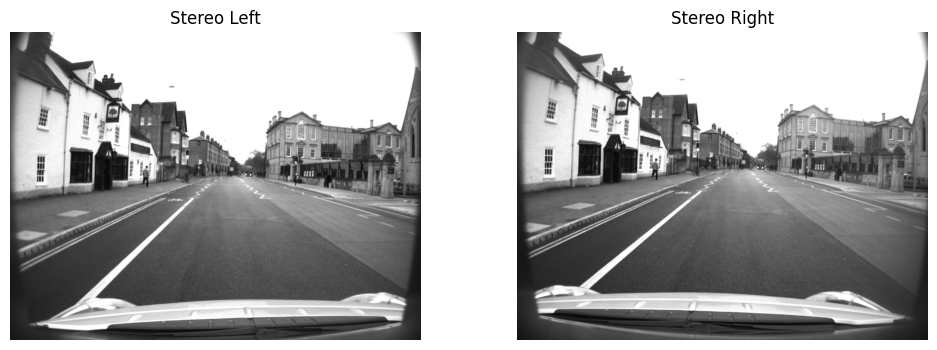

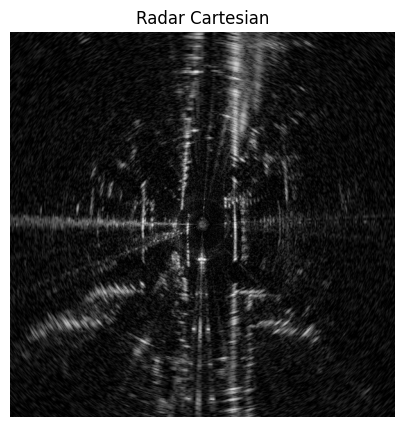

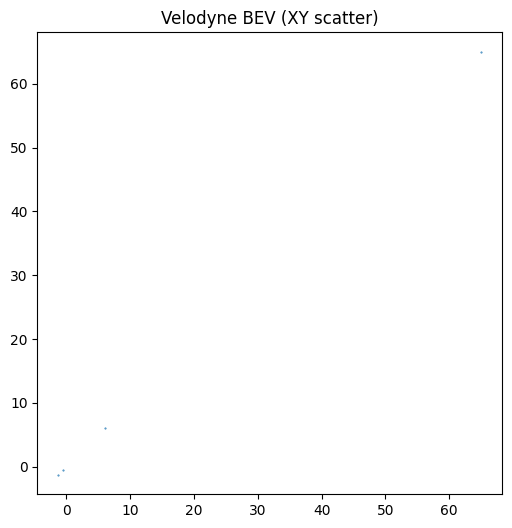

In [60]:
DATA_ROOT = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"

ts0 = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))[0]
frame = get_frame(DATA_ROOT, ts0)
visualize_frame(frame)

#### YOLOv8 (Ultralytics) 설치 + 기본 모델 로드

In [61]:
!pip -q install ultralytics

In [62]:
from ultralytics import YOLO

det_model = YOLO("yolov8s.pt")

#### 객체 탐지 결과 추출 함수 정의 (BBox / Score / Class)

In [63]:
# ============================================================
# 객체 탐지(Detection)
#          - Ultralytics det_model 사용
#          - frame의 left/right 중 선택하여 inference
#          - 결과를 list[dict] 형태로 통일해서 반환
# ============================================================

import numpy as np

# COCO 클래스 이름(ultralytics 기본 names 딕셔너리)
# det_model.names: {0:'person', 1:'bicycle', ...} 형태가 일반적
COCO_NAMES = det_model.names

def detect_objects(frame, conf=0.25, iou=0.45, max_det=50, use_img="left"):
    """
    Stereo 이미지(Left/Right) 중 선택하여 객체 탐지를 수행

    Args:
        frame (dict): get_frame() 반환 dict
        conf (float): confidence threshold (낮출수록 더 많이 잡힘)
        iou (float): NMS IoU threshold
        max_det (int): 최대 탐지 개수 제한
        use_img (str): "left" 또는 "right"

    Returns:
        list of dict:
            [
              {
                "xyxy": np.array([x1,y1,x2,y2]),
                "conf": float,
                "cls_id": int,
                "cls_name": str
              },
              ...
            ]
    """

    # ------------------------------------------------------------
    # 1) 입력 이미지 선택 (RGB numpy)
    # ------------------------------------------------------------
    img = frame["left_img"] if use_img == "left" else frame["right_img"]

    # ------------------------------------------------------------
    # 2) 모델 추론
    #    - Ultralytics는 RGB numpy array 입력 가능
    #    - results[0].boxes 에 bounding box 결과가 담김
    # ------------------------------------------------------------
    results = det_model.predict(
        img,
        conf=conf,
        iou=iou,
        max_det=max_det,
        verbose=False
    )

    dets = []
    r0 = results[0]

    # ------------------------------------------------------------
    # 3) 탐지 결과가 없으면 빈 리스트 반환
    # ------------------------------------------------------------
    if r0.boxes is None or len(r0.boxes) == 0:
        return dets

    # ------------------------------------------------------------
    # 4) boxes를 순회하며 우리가 쓰기 좋은 dict 포맷으로 변환
    # ------------------------------------------------------------
    boxes = r0.boxes
    for b in boxes:
        # b.xyxy: (1,4) tensor
        xyxy = b.xyxy[0].cpu().numpy().astype(float)  # [x1,y1,x2,y2]
        score = float(b.conf[0].cpu().numpy())
        cls_id = int(b.cls[0].cpu().numpy())

        # COCO class name 매핑 (없으면 id 문자열로 대체)
        cls_name = COCO_NAMES.get(cls_id, str(cls_id))

        dets.append({
            "xyxy": xyxy,
            "conf": score,
            "cls_id": cls_id,
            "cls_name": cls_name
        })

    return dets

#### 카메라 프레임 기반 객체 탐지 실행

In [64]:
# ============================================================
# 탐지 결과 시각화(이미지 위에 박스/라벨 그리기)
#          - 내부적으로 OpenCV(BGR)로 그린 뒤 다시 RGB로 반환
# ============================================================

import cv2

def draw_detections_rgb(img_rgb, dets, min_conf=0.25, show_label=True):
    """
    RGB 이미지 위에 detection bounding box를 그려 반환합니다.

    Args:
        img_rgb (np.ndarray): RGB 이미지 (H,W,3)
        dets (list): detect_objects() 결과 리스트
        min_conf (float): 이 값 미만인 박스는 그리지 않음
        show_label (bool): 클래스/점수 텍스트 표시 여부

    Returns:
        np.ndarray: 박스가 그려진 RGB 이미지
    """

    # 원본 변경 방지
    img = img_rgb.copy()

    # OpenCV는 BGR 기반이므로 변환 후 draw
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    for d in dets:
        if d["conf"] < min_conf:
            continue

        # float 좌표 → int 좌표
        x1, y1, x2, y2 = d["xyxy"]
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

        # 박스 그리기
        cv2.rectangle(img_bgr, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # 라벨 표시
        if show_label:
            label = f'{d["cls_name"]} {d["conf"]:.2f}'
            cv2.putText(
                img_bgr,
                label,
                (x1, max(0, y1 - 8)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (0, 255, 0),
                2
            )

    # 다시 RGB로 변환해서 반환
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

#### 탐지 결과 시각화 (Bounding Box Overlay)

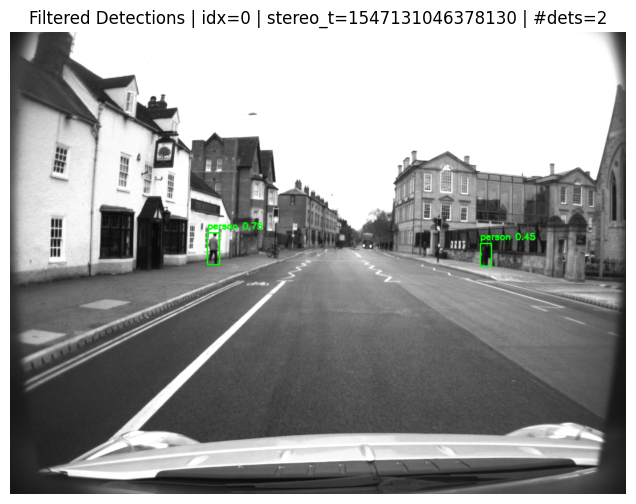

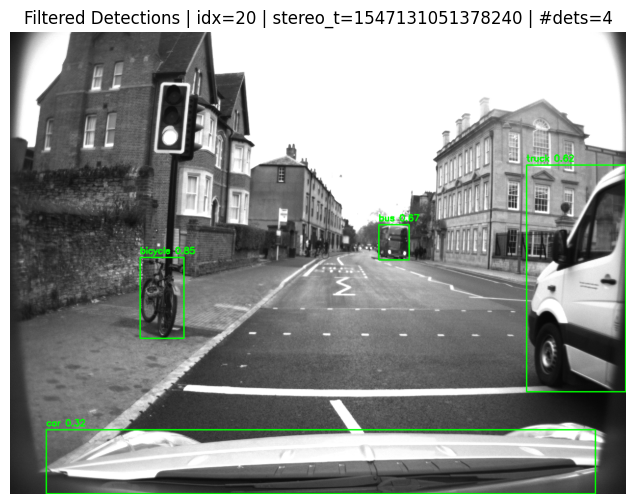

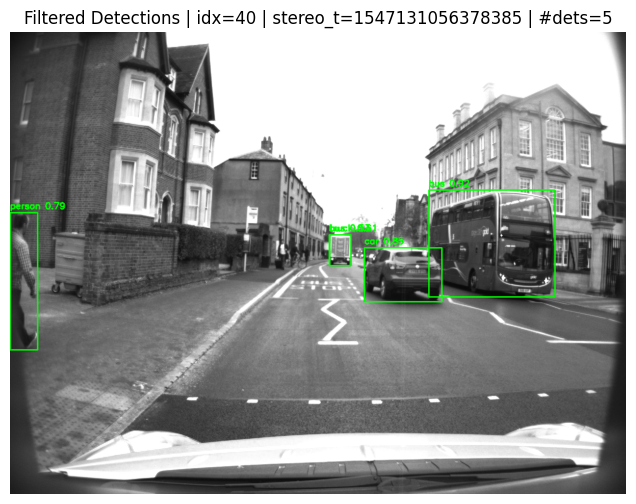

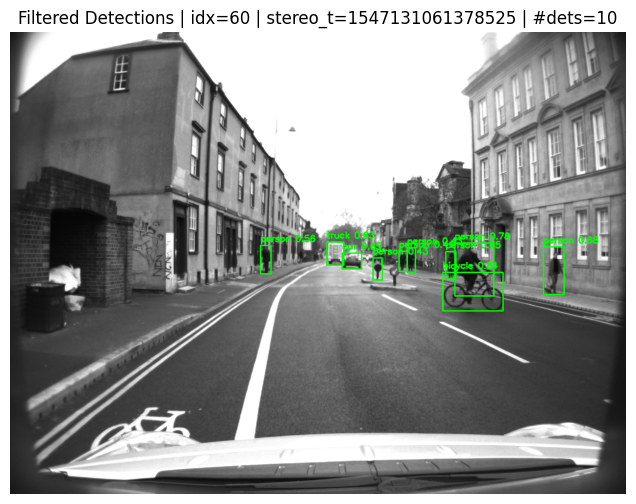

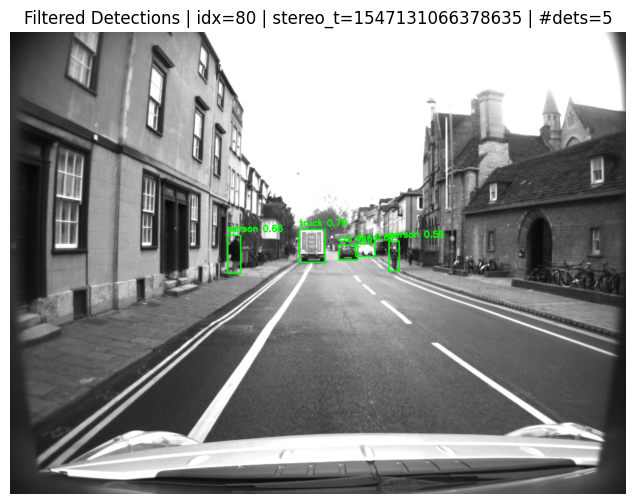

In [65]:
# ============================================================
# 샘플 프레임 선택 → 탐지 → 필터링 → 시각화 루프
#          - radar.timestamps에서 몇 개 인덱스를 골라 테스트
#          - 관심 클래스만 남기고(min_conf 적용) 표시
# ============================================================

import os
import matplotlib.pyplot as plt

DATA_ROOT = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"

# radar.timestamps를 "기준 시각 리스트"로 사용 (프레임 샘플링 목적)
radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))

# 우리가 관심 있는 교통 객체들
TARGET_CLASSES = {"person", "car", "bus", "truck", "motorcycle", "bicycle"}

def filter_dets(dets, target=TARGET_CLASSES, min_conf=0.30):
    """
    dets 중에서:
    - target 클래스에 포함되고
    - confidence가 min_conf 이상인 것만 남김
    """
    return [d for d in dets if d["cls_name"] in target and d["conf"] >= min_conf]

# 프레임을 여러 시점에서 샘플링 (원하는대로 인덱스 바꿔도 됨)
indices = [0, 20, 40, 60, 80]

for idx in indices:
    # ------------------------------------------------------------
    # 1) radar timestamp를 하나 선택(기준 t_query)
    # ------------------------------------------------------------
    t = int(radar_ts[idx])

    # ------------------------------------------------------------
    # 2) 해당 시점에 가장 가까운 stereo/radar/lidar 프레임 묶기
    # ------------------------------------------------------------
    frame = get_frame(DATA_ROOT, t)

    # ------------------------------------------------------------
    # 3) 객체 탐지 수행 (left 이미지 기준)
    # ------------------------------------------------------------
    dets = detect_objects(frame, conf=0.25, iou=0.45, max_det=50, use_img="left")

    # ------------------------------------------------------------
    # 4) 관심 클래스 + 최소 confidence로 필터링
    # ------------------------------------------------------------
    dets_f = filter_dets(dets, min_conf=0.30)

    # ------------------------------------------------------------
    # 5) 시각화 (박스 그려서 출력)
    # ------------------------------------------------------------
    vis = draw_detections_rgb(frame["left_img"], dets_f, min_conf=0.30)

    plt.figure(figsize=(12,6))
    plt.imshow(vis)
    plt.title(
        f"Filtered Detections | idx={idx} | stereo_t={frame['t_stereo']} | #dets={len(dets_f)}"
    )
    plt.axis("off")
    plt.show()

In [66]:
# import os
# import random
# import matplotlib.pyplot as plt

# DATA_ROOT = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"
# radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))

# # 랜덤으로 5개 timestamp 선택
# sample_ts = random.sample(list(radar_ts), 5)

# for t in sample_ts:
#     frame = get_frame(DATA_ROOT, int(t))

#     dets = detect_objects(frame, conf=0.25, iou=0.45, max_det=50, use_img="left")
#     dets_f = filter_dets(dets, min_conf=0.30)

#     vis = draw_detections_rgb(frame["left_img"], dets_f, min_conf=0.30)

#     plt.figure(figsize=(12,6))
#     plt.imshow(vis)
#     plt.title(
#         f"Random frame | t_stereo={frame['t_stereo']} | #dets={len(dets_f)}"
#     )
#     plt.axis("off")
#     plt.show()

In [67]:
# import random
# import os
# import matplotlib.pyplot as plt

# DATA_ROOT = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"

# radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))

# TARGET_CLASSES = {"person", "car", "bus", "truck", "motorcycle", "bicycle"}

# def filter_dets(dets, target=TARGET_CLASSES, min_conf=0.30):
#     return [d for d in dets if d["cls_name"] in target and d["conf"] >= min_conf]

# # 랜덤으로 5개 선택
# sample_ts = random.sample(list(radar_ts), 5)

# for t in sample_ts:
#     frame = get_frame(DATA_ROOT, int(t))

#     dets = detect_objects(frame, conf=0.25, iou=0.45, max_det=50, use_img="left")
#     dets_f = filter_dets(dets, min_conf=0.30)

#     vis = draw_detections_rgb(frame["left_img"], dets_f, min_conf=0.30)

#     plt.figure(figsize=(12,6))
#     plt.imshow(vis)
#     plt.title(
#         f"Filtered Detections | stereo_t={frame['t_stereo']} | #dets={len(dets_f)}"
#     )
#     plt.axis("off")
#     plt.show()

#### 거리 추정 출력 포맷

In [68]:
# ============================================================
# Detection 결과를 "레코드" 형태로 변환
#          - 이후 단계(거리추정: stereo_dist_m / radar_dist_m)를
#            같은 구조로 채워 넣기 쉽게 만드는 중간 포맷
# ============================================================

def dets_to_records(dets):
    """
    dets(list[dict])를 거리 추정 파이프라인에서 다루기 쉬운 records로 변환합니다.

    반환 레코드에는:
    - cls/conf/박스좌표
    - (추후 채움) stereo_dist_m, radar_dist_m

    Args:
        dets (list): detect_objects() 또는 filter_dets()의 출력

    Returns:
        list[dict]
    """
    records = []
    for d in dets:
        x1, y1, x2, y2 = d["xyxy"]
        records.append({
            "cls": d["cls_name"],
            "conf": d["conf"],

            # 박스 좌표 (float로 유지: 후처리 계산에 유리)
            "x1": float(x1), "y1": float(y1),
            "x2": float(x2), "y2": float(y2),

            # ----------------------------------------------------
            # 다음 단계에서 채울 값들 (지금은 None)
            # - stereo_dist_m: 스테레오 기반 거리추정 결과
            # - radar_dist_m : 레이더 기반 거리추정/측정 결과
            # ----------------------------------------------------
            "stereo_dist_m": None,
            "radar_dist_m": None
        })
    return records

# 위 셀의 dets_f(필터된 detection)를 records로 변환
records = dets_to_records(dets_f)

# 앞 3개만 확인
records[:3]

[{'cls': 'truck',
  'conf': 0.7896103262901306,
  'x1': 601.646484375,
  'y1': 410.4156494140625,
  'x2': 654.325927734375,
  'y2': 478.7996826171875,
  'stereo_dist_m': None,
  'radar_dist_m': None},
 {'cls': 'person',
  'conf': 0.6649203896522522,
  'x1': 452.9333190917969,
  'y1': 422.146240234375,
  'x2': 479.7010803222656,
  'y2': 501.031005859375,
  'stereo_dist_m': None,
  'radar_dist_m': None},
 {'cls': 'car',
  'conf': 0.614429235458374,
  'x1': 718.4887084960938,
  'y1': 440.163818359375,
  'x2': 758.5132446289062,
  'y2': 466.1895751953125,
  'stereo_dist_m': None,
  'radar_dist_m': None}]

#### Stereo 매칭(Disparity) 계산

In [69]:
# ============================================================
# Stereo Disparity 계산 (OpenCV StereoSGBM)
#          - 입력: left/right RGB 이미지
#          - 출력: disparity (pixel 단위, float32)
#          - 주의: invalid disparity는 0 이하가 나올 수 있음
# ============================================================

import numpy as np
import cv2

def compute_disparity_sgbm(left_rgb, right_rgb):
    """
    StereoSGBM으로 disparity map(시차)을 계산합니다.

    Args:
        left_rgb, right_rgb (np.ndarray): RGB (H,W,3)

    Returns:
        disp (np.ndarray): float32 (H,W), pixel 단위 disparity
            - OpenCV StereoSGBM 결과는 기본적으로 16배 스케일(int16)로 나오므로 /16.0 처리
            - 유효하지 않은 픽셀은 0 이하가 나올 수 있음(후속 depth 변환에서 제외)
    """

    # ------------------------------------------------------------
    # 1) Stereo 매칭은 보통 grayscale로 수행
    # ------------------------------------------------------------
    left_gray  = cv2.cvtColor(left_rgb,  cv2.COLOR_RGB2GRAY)
    right_gray = cv2.cvtColor(right_rgb, cv2.COLOR_RGB2GRAY)

    # ------------------------------------------------------------
    # 2) SGBM 하이퍼파라미터
    #    - numDisparities는 반드시 16의 배수
    #    - block_size는 매칭 윈도우 크기(클수록 부드러우나 디테일 손실 가능)
    # ------------------------------------------------------------
    min_disp   = 0
    num_disp   = 16 * 10   # 160 (16의 배수)
    block_size = 5

    # ------------------------------------------------------------
    # 3) SGBM matcher 생성
    #    P1/P2: smoothness penalty(연속성 강제)
    #    uniquenessRatio: 모호한 매칭 제거 강도
    #    speckle: 작은 잡음 영역 제거
    # ------------------------------------------------------------
    matcher = cv2.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp,
        blockSize=block_size,
        P1=8  * 1 * block_size * block_size,
        P2=32 * 1 * block_size * block_size,
        disp12MaxDiff=1,
        uniquenessRatio=10,
        speckleWindowSize=100,
        speckleRange=32,
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
    )

    # ------------------------------------------------------------
    # 4) Disparity 계산
    #    OpenCV는 fixed-point로 반환하므로 /16.0
    # ------------------------------------------------------------
    disp = matcher.compute(left_gray, right_gray).astype(np.float32) / 16.0
    return disp

#### Stereo 기반 거리 추정 함수 정의

In [70]:
# ============================================================
# RobotCar Stereo 전체 파이프라인(단일 프레임 테스트)
#          (1) 로드 → (2) demosaic → (3) undistort
#          → (4) disparity(SGBM) → (5) depth(m)
#
#          - Bumblebee XB3 wide-baseline stereo (baseline=0.24m)
#          - CameraModel로 undistort + focal length(fx) 추출
# ============================================================

import os, sys
import cv2
import numpy as np

# ====== PATH ======
DATA_ROOT   = "/content/drive/MyDrive/Colab Notebooks/Self-Driving-Car/robotcar_large_sample"
SDK_PY      = "/content/robotcar-dataset-sdk/python"
MODELS_DIR  = "/content/robotcar-dataset-sdk/models"

# RobotCar SDK 파이썬 경로 추가
if SDK_PY not in sys.path:
    sys.path.insert(0, SDK_PY)

import camera_model

# ------------------------------------------------------------
# RobotCar: Bumblebee XB3 wide-baseline (left+right)
# baseline(좌-우 카메라 간 거리) = 24cm
# ------------------------------------------------------------
BASELINE_M = 0.24

def load_bayer_png_as_rgb(path):
    """
    RobotCar Bumblebee XB3 stereo는 raw Bayer PNG가 나오는 경우가 많음
    - pattern=GBRG로 알려져 있음(환경에 따라 다를 수 있음)
    - cv2로 읽고, Bayer demosaic해서 RGB로 변환

    Args:
        path (str): png 경로

    Returns:
        rgb (np.ndarray): RGB (H,W,3), uint8
    """
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None:
        raise FileNotFoundError(path)

    # 16-bit 이미지면 간단히 8-bit로 다운스케일
    if img.dtype == np.uint16:
        img = (img / 256).astype(np.uint8)

    # Bayer raw: 2D (H,W) 단일 채널
    if img.ndim == 2:
        rgb = cv2.cvtColor(img, cv2.COLOR_BayerGB2RGB)  # GBRG 가정
        return rgb

    # 이미 3채널이면(BGR로 읽힘) RGB로만 변환
    if img.ndim == 3 and img.shape[2] == 3:
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    raise ValueError(f"Unsupported image shape: {img.shape}, dtype={img.dtype}")

def read_first_stereo_timestamp():
    """
    stereo.timestamps에서 첫 줄의 timestamp를 읽어옵니다.
    - 단일 프레임 sanity check 용도
    """
    ts_path = os.path.join(DATA_ROOT, "stereo.timestamps")
    with open(ts_path, "r") as f:
        t = f.readline().split()[0]
    return t

def build_camera_models():
    """
    RobotCar SDK의 CameraModel 생성
    - undistort, focal_length 등 카메라 파라미터 접근 가능
    """
    model_left  = camera_model.CameraModel(MODELS_DIR, os.path.join(DATA_ROOT, "stereo/left"))
    model_right = camera_model.CameraModel(MODELS_DIR, os.path.join(DATA_ROOT, "stereo/right"))
    return model_left, model_right

def compute_disparity_sgbm(left_rgb, right_rgb):
    left_gray  = cv2.cvtColor(left_rgb,  cv2.COLOR_RGB2GRAY)
    right_gray = cv2.cvtColor(right_rgb, cv2.COLOR_RGB2GRAY)

    # SGBM 기본 세팅(나중에 튜닝 가능)
    min_disp = 0
    num_disp = 16 * 10  # 160 (16의 배수)
    block    = 5

    sgbm = cv2.StereoSGBM_create(
        minDisparity=min_disp,
        numDisparities=num_disp,
        blockSize=block,
        P1=8 * block * block,
        P2=32 * block * block,
        disp12MaxDiff=1,
        uniquenessRatio=10,
        speckleWindowSize=100,
        speckleRange=32,
        preFilterCap=63,
        mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY
    )

    disp = sgbm.compute(left_gray, right_gray).astype(np.float32) / 16.0
    return disp

def disparity_to_depth(disp, fx_px, baseline_m):
    """
    disparity → depth 변환 (Z = fx * B / d)

    Args:
        disp (H,W): disparity in pixel (float)
        fx_px (float): focal length in pixels
        baseline_m (float): baseline in meters

    Returns:
        depth (H,W): meters, invalid는 NaN
    """
    depth = np.full_like(disp, np.nan, dtype=np.float32)

    # disparity가 너무 작으면 깊이가 무한대로 튀므로, 최소 임계로 valid 판정
    valid = disp > 1.0
    depth[valid] = (fx_px * baseline_m) / disp[valid]
    return depth

# ====== RUN 1 FRAME ======
t = read_first_stereo_timestamp()

left_path  = os.path.join(DATA_ROOT, "stereo/left",  f"{t}.png")
right_path = os.path.join(DATA_ROOT, "stereo/right", f"{t}.png")

# (1) 로드 + (2) bayer demosaic (가능한 경우)
left_rgb  = load_bayer_png_as_rgb(left_path)
right_rgb = load_bayer_png_as_rgb(right_path)

# CameraModel 준비
model_left, model_right = build_camera_models()

# (3) undistort (렌즈 왜곡 보정)
left_u  = model_left.undistort(left_rgb)
right_u = model_right.undistort(right_rgb)

# focal length fx (pixel 단위)
fx = float(model_left.focal_length[0])  # (fx,fy) 중 fx

# (4) disparity + (5) depth
disp  = compute_disparity_sgbm(left_u, right_u)
depth = disparity_to_depth(disp, fx, BASELINE_M)

print("timestamp:", t)
print("fx(px):", fx, "baseline(m):", BASELINE_M)
print("disp stats:", np.nanmin(disp), np.nanmax(disp))
print("depth stats (m):", np.nanmin(depth), np.nanmax(depth))

timestamp: 1547131046315627
fx(px): 983.044006 baseline(m): 0.24
disp stats: -1.0 159.0
depth stats (m): 1.48384 222.05229


#### 탐지 결과(dets)에 stereo 거리 붙이기

In [71]:
# ============================================================
# Radar 거리(범위) 매칭을 detection에 붙이기
#          - bbox → bearing(방위각) 계산
#          - stereo_dist_m이 정상 범위면 guided matching(윈도우 제한)
#          - stereo가 없거나 비정상이면 unguided matching(탐색 폭 넓힘)
# ============================================================

def attach_radar_range_to_dets(dets, radar_polar, fx, cx,
                               stereo_ok_min=3.0, stereo_ok_max=120.0,
                               guided_window_m=20.0):
    """
    dets에 radar_dist_m과 bearing_rad를 추가해 반환

    Args:
        dets (list[dict]): detection list (xyxy 포함)
        radar_polar: 레이더 polar 데이터(사용중인 radar_range_from_bearing 입력 형식)
        fx, cx (float): 카메라 intrinsics (bearing 계산에 사용)
        stereo_ok_min/max: stereo_dist_m이 "믿을 만한" 범위(가이드 여부 판단)
        guided_window_m: stereo hint 기준으로 +-window 범위에서 레이더 peak 탐색

    Returns:
        out (list[dict]): 원본 det dict + bearing_rad + radar_dist_m
    """
    out = []
    for d in dets:
        # bbox 중심 x를 이용해 bearing(각도)을 계산하는 로직을 보통 사용
        bearing = bbox_to_bearing_rad(d["xyxy"], fx, cx)

        # stereo 거리 힌트(있다면 활용)
        s = d.get("stereo_dist_m", None)

        # stereo가 정상 범위면 guided 매칭
        use_guided = (s is not None) and (stereo_ok_min <= s <= stereo_ok_max)

        if use_guided:
            r = radar_range_from_bearing(
                radar_polar, bearing,
                min_m=4.0, max_m=80.0,
                smooth_k=11,
                thr_quantile=0.98,          # peak threshold(너무 빡세면 못 찾을 수 있음)
                stereo_hint_m=s,
                window_m=guided_window_m    # stereo 근처에서만 찾도록 제한
            )
        else:
            # stereo 힌트 없거나 비정상이면 unguided로 탐색 폭 확대
            r = radar_range_from_bearing(
                radar_polar, bearing,
                min_m=4.0, max_m=80.0,
                smooth_k=11, thr_quantile=0.98,
                stereo_hint_m=None
            )

        dd = dict(d)
        dd["bearing_rad"] = bearing
        dd["radar_dist_m"] = r
        out.append(dd)

    return out

#### 시각화: bbox + class + conf + stereo distance(m)

In [72]:
# ============================================================
# Stereo 거리(stereo_dist_m)를 화면에 그려 확인하기
#          - bbox + (cls/conf + stereo 거리) 라벨로 표시
# ============================================================

import cv2

def draw_dets_with_stereo_dist(img_rgb, dets, min_conf=0.30):
    """
    dets에 stereo_dist_m이 붙어있다고 가정하고,
    이미지에 bbox + 거리 라벨을 그려 반환
    """
    img = img_rgb.copy()
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    for d in dets:
        if d.get("conf", 1.0) < min_conf:
            continue

        x1, y1, x2, y2 = map(int, d["xyxy"])
        cv2.rectangle(bgr, (x1, y1), (x2, y2), (0,255,0), 2)

        dist = d.get("stereo_dist_m", None)
        if dist is None:
            label = f'{d["cls_name"]} {d["conf"]:.2f} | dist: N/A'
        else:
            label = f'{d["cls_name"]} {d["conf"]:.2f} | {dist:.1f}m'

        cv2.putText(
            bgr,
            label,
            (x1, max(0, y1-8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0,255,0),
            2
        )

    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

#### get_frame → undistort → depth → detect → 거리 추정 → 오버레이

In [73]:
# ============================================================
# bbox_depth_robust + stereo 거리 attach 함수
#          - depth map에서 bbox 내부 대표 거리(m)를 뽑고
#          - dets에 stereo_dist_m로 붙여 반환
# ============================================================

import numpy as np

def bbox_depth_robust(depth_m, xyxy, inner=0.15, min_valid=20, clip_percent=(5, 95)):
    """
    Args:
        depth_m (H,W): depth in meters (invalid: 0/inf/nan 가능)
        xyxy: [x1,y1,x2,y2]
        inner: bbox 테두리 제외 비율 (0.15면 15%씩 안쪽)
        min_valid: 유효 픽셀 최소 개수
        clip_percent: outlier 제거용 분위수 (5~95)
    """
    H, W = depth_m.shape[:2]
    x1, y1, x2, y2 = map(float, xyxy)

    # --------------------
    # 1) bbox 좌표를 이미지 경계로 클리핑
    # --------------------
    x1 = int(max(0, min(W-1, x1)))
    x2 = int(max(0, min(W-1, x2)))
    y1 = int(max(0, min(H-1, y1)))
    y2 = int(max(0, min(H-1, y2)))

    if x2 <= x1 or y2 <= y1:
        return None

    bw = x2 - x1
    bh = y2 - y1

    # --------------------
    # 2) inner 영역(테두리 제거) 계산
    # --------------------
    ix1 = int(x1 + bw * inner)
    ix2 = int(x2 - bw * inner)
    iy1 = int(y1 + bh * inner)
    iy2 = int(y2 - bh * inner)

    # slice 범위 보정(최소 1픽셀 이상 유지)
    ix1 = max(x1,   min(W-1, ix1))
    ix2 = max(x1+1, min(W,   ix2))
    iy1 = max(y1,   min(H-1, iy1))
    iy2 = max(y1+1, min(H,   iy2))

    patch = depth_m[iy1:iy2, ix1:ix2].astype(np.float32)
    if patch.size == 0:
        return None

    # --------------------
    # 3) 유효 depth만 추출
    #    - finite & >0
    # --------------------
    valid = patch[np.isfinite(patch) & (patch > 0)]
    if valid.size < min_valid:
        return None

    # --------------------
    # 4) 분위수 클리핑(outlier 제거)
    # --------------------
    lo, hi = np.percentile(valid, clip_percent)
    valid2 = valid[(valid >= lo) & (valid <= hi)]
    if valid2.size < min_valid:
        return None

    # 대표값: median
    return float(np.median(valid2))


def attach_stereo_range_to_dets(dets, depth_m, min_valid_m=2.0, max_valid_m=120.0):
    """
    dets(list[dict])에 stereo_dist_m를 붙여 반환

    - bbox_depth_robust로 bbox 내부 depth의 median을 뽑음
    - 너무 가깝거나/너무 먼 비정상 값은 None 처리

    Args:
        dets (list[dict]): detection 리스트(각 dict에 xyxy 필요)
        depth_m (H,W): depth map (meters)
        min_valid_m/max_valid_m: 유효 거리 범위

    Returns:
        out (list[dict]): 각 det에 stereo_dist_m 추가된 리스트
    """
    out = []
    for d in dets:
        dist = bbox_depth_robust(depth_m, d["xyxy"], inner=0.15, min_valid=20, clip_percent=(5,95))

        # 거리 범위 sanity check
        if dist is not None:
            if not (min_valid_m <= dist <= max_valid_m):
                dist = None

        dd = dict(d)
        dd["stereo_dist_m"] = dist
        out.append(dd)

    return out

#### 레이더 원본 가져오기

In [74]:
# ============================================================
# Radar polar 데이터 로드 + shape 표준화
#          - radar.load_radar() 출력은 SDK/버전에 따라 shape이 (N,1)처럼 붙는 경우가 많음
#          - azimuths: (N,)
#          - fft:      (N, R)
#          - radar_res: float (m/bin)
# ============================================================

import numpy as np
import os

def load_radar_polar(DATA_ROOT, t_radar):
    """
    Radar PNG(Polar) 하나를 읽어서, 이후 range 추정에 필요한 형태로 정리

    Args:
        DATA_ROOT (str): RobotCar 데이터 루트
        t_radar (int): radar timestamp

    Returns:
        dict:
          - radar_png (str): 읽은 파일 경로
          - azimuths (float32, shape=(N,)): 각 스윕의 방위각(rad)
          - valid (np.ndarray or None): azimuth별 유효 여부(있으면 사용)
          - fft (float32, shape=(N,R)): azimuth별 range profile(강도)
          - radar_res (float): range bin 해상도 (m/bin)
    """

    # radar/{timestamp}.png 로드
    radar_png = os.path.join(DATA_ROOT, "radar", f"{t_radar}.png")
    timestamps, azimuths, valid, fft_data, radar_res = radar.load_radar(radar_png)

    # ------------------------------------------------------------
    # 1) radar_res는 SDK에 따라 (1,) 배열/스칼라로 섞여 들어올 수 있어 float로 확정
    # ------------------------------------------------------------
    radar_res = float(np.array(radar_res).squeeze())

    # ------------------------------------------------------------
    # 2) shape 표준화
    #    - azimuths: (N,1) -> (N,)
    #    - fft_data: (N,R,1) -> (N,R)
    # ------------------------------------------------------------
    azimuths = np.array(azimuths).squeeze()
    fft = np.array(fft_data).squeeze()

    # ------------------------------------------------------------
    # 3) 안전 확인 (형태가 기대와 다르면 즉시 터뜨려서 디버깅 쉽게)
    # ------------------------------------------------------------
    if azimuths.ndim != 1:
        raise ValueError(f"azimuths should be 1D after squeeze, got {azimuths.shape}")
    if fft.ndim != 2:
        raise ValueError(f"fft should be 2D after squeeze, got {fft.shape}")

    return {
        "radar_png": radar_png,
        "azimuths": azimuths.astype(np.float32),   # (N,)
        "valid": np.array(valid).squeeze() if valid is not None else None,
        "fft": fft.astype(np.float32),             # (N,R)
        "radar_res": radar_res
    }

#### 카메라 bbox → bearing 추정

In [75]:
# ============================================================
# 카메라 intrinsic에서 fx/cx 얻기 + bbox → bearing 변환
#          - fx: focal length in pixels
#          - cx: principal point x (없으면 이미지 중앙으로 추정)
#          - bearing(rad): pinhole 근사 arctan((u-cx)/fx)
# ============================================================

import numpy as np

def get_fx_and_cx(model_left, img_w):
    """
    CameraModel에서 fx, cx를 얻음
    - fx는 focal_length[0]로 확정적
    - cx(주점)는 SDK 버전에 따라 attribute 이름이 다를 수 있어 후보를 순회
    - 못 찾으면 이미지 중심(img_w/2)으로 근사

    Args:
        model_left: camera_model.CameraModel 인스턴스
        img_w (int): 이미지 폭 (fallback cx 계산에 사용)

    Returns:
        fx (float), cx (float)
    """

    # fx는 CameraModel에서 보통 focal_length=(fx,fy)로 제공됨
    fx = float(model_left.focal_length[0])

    # cx는 SDK 버전에 따라 속성명이 달라질 수 있어 후보를 탐색
    cx = None
    for cand in ["principal_point", "center", "c", "pp"]:
        if hasattr(model_left, cand):
            v = getattr(model_left, cand)

            # principal_point가 (cx, cy) 형태인 경우가 흔함
            try:
                cx = float(v[0])
                break
            except Exception:
                pass

    # 못 찾으면 이미지 중심으로 근사
    if cx is None:
        cx = img_w / 2.0

    return fx, cx


def bbox_to_bearing_rad(xyxy, fx, cx):
    """
    bbox 중심 x좌표(u)를 카메라 좌표계 방위각(bearing, rad)로 근사 변환
    - pinhole model: theta = arctan((u - cx) / fx)

    Args:
        xyxy: (x1,y1,x2,y2)
        fx (float): focal length(px)
        cx (float): principal point x(px)

    Returns:
        bearing_rad (float): radian
    """
    x1, y1, x2, y2 = map(float, xyxy)
    u = (x1 + x2) / 2.0  # bbox 중심 x

    # arctan2 사용: 안정적으로 각도 계산
    return float(np.arctan2((u - cx), fx))

#### bearing → 레이더에서 거리 peak 뽑기

In [94]:
# ============================================================
# Radar range 추정 핵심 함수들
#          - smooth_1d: 1D moving average smoothing
#          - _radar_peak_in_window: 특정 거리 구간(lo~hi)에서 peak 후보 찾기
#          - radar_range_from_bearing: bearing에 해당하는 azimuth slice 선택 후,
#                                     guided(스테레오 힌트) → 실패 시 unguided fallback
# ============================================================

import numpy as np

def smooth_1d(x, k=11):
    """
    1D 신호(레인지 프로파일)에 이동평균 smoothing 적용
    - k는 홀수로 맞춤(중심 정렬)
    - edge padding 후 컨볼루션

    Args:
        x (array-like): 1D signal
        k (int): window size (홀수 권장, 9~21 범위에서 많이 씀)

    Returns:
        smoothed 1D np.ndarray
    """
    x = np.asarray(x, dtype=np.float32).reshape(-1)
    if k <= 1:
        return x

    # k를 홀수로 보정
    k = int(k) if int(k) % 2 == 1 else int(k) + 1

    pad = k // 2
    xp = np.pad(x, (pad, pad), mode="edge")
    kernel = np.ones(k, dtype=np.float32) / k

    return np.convolve(xp, kernel, mode="valid")


def _radar_peak_in_window(prof_full, radar_res, lo_m, hi_m, smooth_k, thr_quantile):
    """
    레인지 프로파일(prof_full)에서 [lo_m, hi_m] 구간만 잘라 peak를 찾음

    아이디어:
      1) 거리 구간을 bin index로 변환
      2) smoothing 적용
      3) 상위 quantile(thr_quantile) 이상인 구간을 '신호 후보'로 간주
      4) 후보 구간의 "첫 번째" bin을 반환 (가까운 물체 우선)

    Args:
        prof_full (1D np.ndarray): range profile (길이 R)
        radar_res (float): m/bin
        lo_m, hi_m (float): 탐색 거리 범위(m)
        smooth_k (int): smoothing window
        thr_quantile (float): 0.98~0.995 정도로 임계 결정(높을수록 보수적)

    Returns:
        distance_m (float) or None
    """
    # 거리(m) → bin index
    r0 = int(max(0, lo_m / radar_res))
    r1 = int(min(len(prof_full), hi_m / radar_res))

    prof = prof_full[r0:r1]
    if prof.size < 10:
        return None

    # smoothing
    prof_s = smooth_1d(prof, k=smooth_k)

    # 임계값: 상위 quantile 이상을 "강한 반사"로 간주
    thr = float(np.quantile(prof_s, thr_quantile))
    mask = prof_s >= thr
    if not np.any(mask):
        return None

    # 가장 가까운(가장 이른) peak 후보를 반환
    first = int(np.argmax(mask))
    return float((r0 + first) * radar_res)


def radar_range_from_bearing(
    radar_polar,
    bearing_rad,
    # 기본 unguided 범위
    min_m=4.0,
    max_m=80.0,
    smooth_k=11,
    thr_quantile=0.99,

    # stereo guided 옵션
    stereo_hint_m=None,
    window_m=20.0,
    guided_thr_quantile=0.98
):
    """
    bearing_rad 방향에서 레이더 거리(range)를 추정합니다.

    동작:
    1) (가능하면) stereo_hint_m 주변(window_m) 범위에서 peak 탐색 (guided)
    2) 실패하면 전체(min_m~max_m) 범위에서 peak 탐색 (unguided fallback)

    Returns:
        float: 추정 거리(m) 또는 None
    """
    azimuths = radar_polar["azimuths"]      # (N,)
    fft = radar_polar["fft"]               # (N, R)
    radar_res = radar_polar["radar_res"]   # meter/bin
    valid = radar_polar.get("valid", None)

    # ------------------------------------------------------------
    # 1) bearing과 가장 가까운 azimuth index 찾기 (각도 wrap 고려)
    #    diff = angle(exp(j*(az - bearing))) 형태로 -pi~pi로 정규화
    # ------------------------------------------------------------
    diff = np.angle(np.exp(1j * (azimuths - bearing_rad)))
    idx = int(np.argmin(np.abs(diff)))

    # ------------------------------------------------------------
    # 2) valid 마스크가 있는 경우, invalid azimuth면 주변 valid로 대체
    # ------------------------------------------------------------
    if valid is not None and len(valid) == len(azimuths) and (not bool(valid[idx])):
        for d in [1, 2, 3, 4, 5]:
            for j in [idx - d, idx + d]:
                if 0 <= j < len(valid) and bool(valid[j]):
                    idx = j
                    break

    # ------------------------------------------------------------
    # 3) 해당 azimuth의 range profile 꺼내기 (길이 R)
    # ------------------------------------------------------------
    prof_full = np.asarray(fft[idx], dtype=np.float32).reshape(-1)

    # ------------------------------------------------------------
    # 4) stereo guided 시도 (가능한 경우)
    # ------------------------------------------------------------
    if stereo_hint_m is not None and np.isfinite(stereo_hint_m):
        lo = max(min_m, float(stereo_hint_m) - float(window_m))
        hi = min(max_m, float(stereo_hint_m) + float(window_m))

        if hi > lo:
            d1 = _radar_peak_in_window(
                prof_full, radar_res, lo, hi,
                smooth_k=smooth_k,
                thr_quantile=guided_thr_quantile
            )
            if d1 is not None:
                return d1  # ✅ guided 성공

    # ------------------------------------------------------------
    # 5) guided 실패 or stereo 없음 → unguided fallback
    # ------------------------------------------------------------
    return _radar_peak_in_window(
        prof_full, radar_res, min_m, max_m,
        smooth_k=smooth_k,
        thr_quantile=thr_quantile
    )

#### dets에 radar 거리 붙이고 stereo와 비교

In [95]:
# ============================================================
# dets에 radar 거리 붙이기 + stereo/radar 비교 테이블 생성
#          - attach_radar_range_to_dets: 각 det에 bearing_rad, radar_dist_m 추가
#          - compare_stereo_radar: stereo_dist_m vs radar_dist_m 절대오차 계산
# ============================================================

def attach_radar_range_to_dets(dets, radar_polar, fx, cx):
    """
    dets(list[dict])에 레이더 기반 거리(radar_dist_m)를 붙임

    Args:
        dets: detection list (각 dict에 "xyxy" 필요)
        radar_polar: load_radar_polar() 결과 dict
        fx, cx: bearing 계산용 카메라 intrinsic

    Returns:
        out: 각 det에 bearing_rad, radar_dist_m가 추가된 리스트
    """
    out = []
    for d in dets:
        # 1) bbox → bearing(방위각)
        bearing = bbox_to_bearing_rad(d["xyxy"], fx, cx)

        # 2) stereo 거리 힌트(있으면 guided 탐색에 활용)
        s = d.get("stereo_dist_m", None)

        # 3) bearing 방향의 range profile에서 peak를 찾아 거리 추정
        #    - window_m: stereo 힌트 기반 탐색 범위(가이드) 폭
        r = radar_range_from_bearing(
            radar_polar, bearing,
            stereo_hint_m=s,
            window_m=15.0,     # 필요하면 10~25로 조절
        )

        dd = dict(d)
        dd["bearing_rad"] = bearing
        dd["radar_dist_m"] = r
        out.append(dd)

    return out


def compare_stereo_radar(dets):
    """
    dets에서 stereo_dist_m, radar_dist_m 둘 다 있는 경우 abs_err_m을 계산
    - 결과는 "표 형태로 보기 좋은 dict 리스트"로 반환

    Returns:
        rows: list[dict] (cls/conf/stereo_m/radar_m/abs_err_m)
    """
    rows = []
    for d in dets:
        s = d.get("stereo_dist_m", None)
        r = d.get("radar_dist_m", None)

        # 둘 다 있을 때만 오류 계산
        if s is None or r is None:
            err = None
        else:
            err = float(abs(s - r))

        rows.append({
            "cls": d.get("cls_name"),
            "conf": d.get("conf"),
            "stereo_m": s,
            "radar_m": r,
            "abs_err_m": err
        })

    return rows

#### stereo+radar 거리 오버레이

In [96]:
# ============================================================
# dets에 stereo 거리 붙이기 (depth map + bbox_depth_robust)
#          - bbox_depth_robust로 bbox 내부 대표 depth(m)를 추출
#          - 유효 범위(min_valid_m~max_valid_m) 밖이면 None 처리
# ============================================================

def attach_stereo_range_to_dets(dets, depth_m, min_valid_m=2.0, max_valid_m=120.0):
    """
    dets(list[dict])에 stereo_dist_m를 붙여 반환

    Args:
        dets: detection list (각 dict에 "xyxy" 필요)
        depth_m (H,W): disparity_to_depth()에서 만든 depth map (meters)
        min_valid_m/max_valid_m: stereo 거리 sanity 범위 (너무 작거나 크면 제거)

    Returns:
        out: 각 det에 stereo_dist_m가 추가된 리스트
    """
    out = []
    for d in dets:
        # bbox 영역의 depth 대표값(중앙부 + 분위수 클리핑 + median)
        dist = bbox_depth_robust(
            depth_m, d["xyxy"],
            inner=0.15,
            min_valid=50,
            clip_percent=(5,95)
        )

        # 너무 가깝거나 너무 먼 값은 비정상으로 간주하고 제거
        if dist is not None:
            if not (min_valid_m <= dist <= max_valid_m):
                dist = None

        dd = dict(d)
        dd["stereo_dist_m"] = dist
        out.append(dd)

    return out

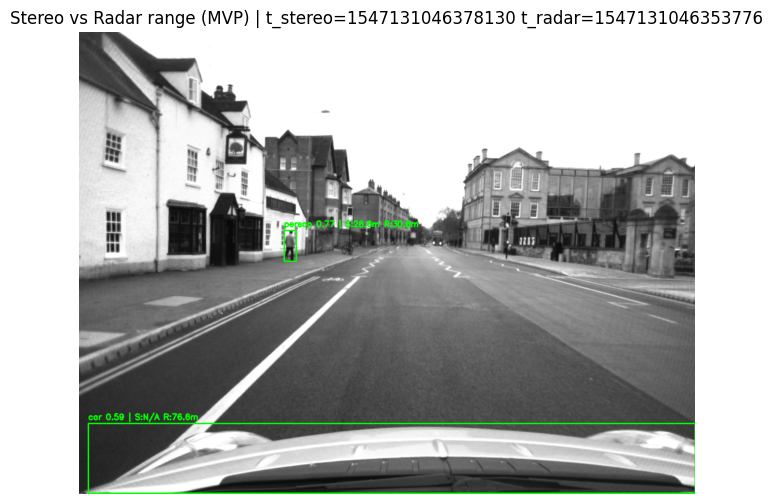

Rows with both stereo & radar: 1


[{'cls': 'person',
  'conf': 0.7703017592430115,
  'stereo_m': 28.59764289855957,
  'radar_m': 30.844800800085068,
  'abs_err_m': 2.2471579015254974}]

In [97]:
# ============================================================
# Stereo+Radar 거리 모두 그려서 시각화 + end-to-end MVP 실행
#          1) 프레임 로드(get_frame)
#          2) undistort + disparity + depth
#          3) detect + (필터링)
#          4) stereo 거리 attach
#          5) radar polar 로드 + radar 거리 attach
#          6) 시각화 + 비교표 출력
# ============================================================

import matplotlib.pyplot as plt
import cv2
import os

def draw_dets_with_stereo_radar(img_rgb, dets, min_conf=0.30):
    """
    이미지 위에 bbox + (Stereo 거리 / Radar 거리)를 동시에 표시

    Args:
        img_rgb: RGB 이미지
        dets: stereo_dist_m, radar_dist_m가 포함된 det list
        min_conf: 이 값 미만은 표시하지 않음

    Returns:
        annotated RGB 이미지
    """
    img = img_rgb.copy()
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    for d in dets:
        if d.get("conf", 1.0) < min_conf:
            continue

        x1, y1, x2, y2 = map(int, d["xyxy"])
        s = d.get("stereo_dist_m", None)
        r = d.get("radar_dist_m", None)

        # bbox
        cv2.rectangle(bgr, (x1,y1), (x2,y2), (0,255,0), 2)

        # 텍스트: Stereo/Radar 둘 다 없을 수 있으므로 N/A 처리
        s_txt = "N/A" if s is None else f"{s:.1f}m"
        r_txt = "N/A" if r is None else f"{r:.1f}m"
        label = f'{d["cls_name"]} {d["conf"]:.2f} | S:{s_txt} R:{r_txt}'

        cv2.putText(
            bgr,
            label,
            (x1, max(0, y1-8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            (0,255,0),
            2
        )

    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)


# ====== 1) 프레임 로드 ======
# radar.timestamps 첫 프레임을 기준으로 (가장 가까운 stereo/lidar/radar 묶기)
t0 = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))[0]
frame = get_frame(DATA_ROOT, int(t0))

# ====== 2) stereo undistort + depth ======
# 주의: get_frame()에서 가져온 left/right는 이미 RGB이지만,
#       undistort는 raw/undistort 여부에 따라 결과가 달라질 수 있음
left_rgb  = frame["left_img"]
right_rgb = frame["right_img"]

left_u  = model_left.undistort(left_rgb)
right_u = model_right.undistort(right_rgb)

disp  = compute_disparity_sgbm(left_u, right_u)
depth = disparity_to_depth(disp, fx, BASELINE_M)

# ====== 3) detect ======
# detect_objects는 frame dict에서 left_img/right_img 키를 사용하므로
# undistort된 이미지를 쓰려면 임시 dict로 넣어줌
dets = detect_objects(
    {"left_img": left_u, "right_img": right_u},
    conf=0.25, iou=0.45, max_det=50, use_img="left"
)

# 필터 함수가 있으면 쓰고, 없으면 conf 기준으로만 필터
try:
    dets = filter_dets(dets, min_conf=0.30)
except Exception:
    dets = [d for d in dets if d["conf"] >= 0.30]

# ====== 4) stereo 거리 붙이기 ======
dets = attach_stereo_range_to_dets(dets, depth)

# ====== 5) radar polar 로드 + radar 거리 붙이기 ======
radar_polar = load_radar_polar(DATA_ROOT, frame["t_radar"])

# bearing 계산에 필요한 fx, cx 준비
img_h, img_w = left_u.shape[:2]
fx_local, cx_local = get_fx_and_cx(model_left, img_w)

dets = attach_radar_range_to_dets(dets, radar_polar, fx_local, cx_local)

# ====== 6) 시각화 ======
vis = draw_dets_with_stereo_radar(left_u, dets, min_conf=0.30)
plt.figure(figsize=(12,6))
plt.imshow(vis)
plt.title(f"Stereo vs Radar range (MVP) | t_stereo={frame['t_stereo']} t_radar={frame['t_radar']}")
plt.axis("off")
plt.show()

# 비교표(상위 10개)
rows = compare_stereo_radar(dets)
rows_sorted = sorted(
    [r for r in rows if r["abs_err_m"] is not None],
    key=lambda x: x["abs_err_m"]
)

print("Rows with both stereo & radar:", len(rows_sorted))
rows_sorted[:10]

#### 샘플 30프레임 평가

In [98]:
# ============================================================
# timestamp 샘플링 + 여러 프레임 평가(프레임 단위 요약)
#          - 전체 radar.timestamps에서 n_frames개를 균일 간격으로 뽑아 평가
#          - 각 프레임마다: stereo depth -> detect -> stereo range -> radar range -> 오차 통계
#          - 반환: 프레임별 summary 리스트
# ============================================================

import os, numpy as np

def sample_timestamps(ts_list, n=30):
    """
    타임스탬프 리스트에서 n개만 균일 샘플링
    - 길이가 n 이하이면 그대로 반환
    - 길이가 길면 linspace로 균일 분포 인덱스 선택

    Args:
        ts_list (list): timestamps (문자열/정수 혼합 가능)
        n (int): 샘플 개수

    Returns:
        list: 샘플링된 timestamps
    """
    if len(ts_list) <= n:
        return ts_list

    # 예: 0 ~ len-1 범위에서 n개를 균일하게 뽑음
    idxs = np.linspace(0, len(ts_list)-1, n).astype(int)
    return [ts_list[i] for i in idxs]


def eval_on_frames(DATA_ROOT, n_frames=30, min_conf=0.30):
    """
    여러 프레임에서 stereo vs radar 거리 오차를 요약 평가
    (MVP용 스코어링/통계 확인)

    Args:
        DATA_ROOT (str): RobotCar dataset root
        n_frames (int): 평가할 프레임 수(균일 샘플링)
        min_conf (float): detection confidence 최소값

    Returns:
        results (list[dict]):
            각 프레임별 요약:
              - t_radar, t_stereo
              - n_det: 탐지 수
              - n_both: stereo/radar 둘 다 거리 붙은 객체 수
              - median_abs_err: 해당 프레임에서 abs_err 중앙값
              - max_abs_err: 해당 프레임에서 abs_err 최대값
    """
    # 1) radar timestamps 전체 로드 → n_frames개로 샘플링
    radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))
    radar_ts_s = sample_timestamps(radar_ts, n=n_frames)

    results = []
    for t0 in radar_ts_s:
        # ------------------------------------------------------------
        # (A) 1 프레임 로드: radar 타임 기준으로 stereo/lidar까지 nearest match
        # ------------------------------------------------------------
        frame = get_frame(DATA_ROOT, int(t0))

        # ------------------------------------------------------------
        # (B) Stereo depth 준비
        #     - undistort → disparity(SGBM) → depth(m)
        # ------------------------------------------------------------
        left_rgb  = frame["left_img"]
        right_rgb = frame["right_img"]

        left_u  = model_left.undistort(left_rgb)
        right_u = model_right.undistort(right_rgb)

        disp  = compute_disparity_sgbm(left_u, right_u)
        depth = disparity_to_depth(disp, fx, BASELINE_M)

        # ------------------------------------------------------------
        # (C) Object detection (left image 기준)
        # ------------------------------------------------------------
        dets = detect_objects(
            {"left_img": left_u, "right_img": right_u},
            conf=0.25, iou=0.45, max_det=50, use_img="left"
        )

        # 모델에 따라 d["conf"]가 없을 수 있으므로 get 사용
        dets = [d for d in dets if d.get("conf", 1.0) >= min_conf]

        # ------------------------------------------------------------
        # (D) Stereo 거리 붙이기 (bbox 내부 depth median)
        #     dets[*]["stereo_dist_m"] 추가
        # ------------------------------------------------------------
        dets = attach_stereo_range_to_dets(dets, depth)

        # ------------------------------------------------------------
        # (E) Radar 거리 붙이기
        #     - radar polar 로드
        #     - fx/cx로 bbox → bearing
        #     - dets[*]["radar_dist_m"] 추가
        # ------------------------------------------------------------
        radar_polar = load_radar_polar(DATA_ROOT, frame["t_radar"])

        img_h, img_w = left_u.shape[:2]
        fx_local, cx_local = get_fx_and_cx(model_left, img_w)

        dets = attach_radar_range_to_dets(dets, radar_polar, fx_local, cx_local)

        # ------------------------------------------------------------
        # (F) stereo/radar 둘 다 있는 객체만 골라 오차 계산
        # ------------------------------------------------------------
        rows = compare_stereo_radar(dets)
        both = [r for r in rows if (r["stereo_m"] is not None and r["radar_m"] is not None)]

        abs_errs = [r["abs_err_m"] for r in both if r["abs_err_m"] is not None]

        # ------------------------------------------------------------
        # (G) 프레임 단위 summary 저장
        # ------------------------------------------------------------
        results.append({
            "t_radar": frame["t_radar"],
            "t_stereo": frame["t_stereo"],
            "n_det": len(dets),
            "n_both": len(both),
            "median_abs_err": float(np.median(abs_errs)) if abs_errs else None,
            "max_abs_err": float(np.max(abs_errs)) if abs_errs else None,
        })

    return results


# 실행: 프레임 요약 리스트
res = eval_on_frames(DATA_ROOT, n_frames=30, min_conf=0.30)
res

[{'t_radar': 1547131046353776,
  't_stereo': 1547131046378130,
  'n_det': 2,
  'n_both': 1,
  'median_abs_err': 2.2471579015254974,
  'max_abs_err': 2.2471579015254974},
 {'t_radar': 1547131050605600,
  't_stereo': 1547131050628232,
  'n_det': 6,
  'n_both': 5,
  'median_abs_err': 1.7870845198631287,
  'max_abs_err': 27.49922090768814},
 {'t_radar': 1547131054845109,
  't_stereo': 1547131054815830,
  'n_det': 4,
  'n_both': 3,
  'median_abs_err': 3.7515809237957,
  'max_abs_err': 3.7515809237957},
 {'t_radar': 1547131059109484,
  't_stereo': 1547131059128467,
  'n_det': 5,
  'n_both': 4,
  'median_abs_err': 2.8833000287413597,
  'max_abs_err': 8.00669053196907},
 {'t_radar': 1547131063620001,
  't_stereo': 1547131063628582,
  'n_det': 6,
  'n_both': 6,
  'median_abs_err': 7.026713401079178,
  'max_abs_err': 14.68263229727745},
 {'t_radar': 1547131067871514,
  't_stereo': 1547131067878684,
  'n_det': 7,
  'n_both': 6,
  'median_abs_err': 3.892461746931076,
  'max_abs_err': 11.6963077634

#### 요약 통계 출력

In [99]:
# ============================================================
# eval_on_frames 결과를 전체 통계로 요약
#          - matched object가 1개 이상 있는 프레임만 따로 집계(vals)
# ============================================================

vals = [r for r in res if r["median_abs_err"] is not None]

print("Frames evaluated:", len(res))
print("Frames with >=1 matched object:", len(vals))

if vals:
    # 프레임별 median_abs_err들의 중앙값 → "프레임 기준 전반적 성능" 느낌
    med = np.median([r["median_abs_err"] for r in vals])

    # 각 프레임 max_abs_err 중 최대값 → 최악 케이스
    mx  = np.max([r["max_abs_err"] for r in vals])

    print("Median of frame-median abs error (m):", float(med))
    print("Max abs error observed (m):", float(mx))

# n_both(매칭된 객체 수) 분포
nb = [r["n_both"] for r in res]
print("Avg n_both:", float(np.mean(nb)), "Min:", int(np.min(nb)), "Max:", int(np.max(nb)))

Frames evaluated: 30
Frames with >=1 matched object: 30
Median of frame-median abs error (m): 5.232416592538357
Max abs error observed (m): 112.43567848205566
Avg n_both: 5.733333333333333 Min: 1 Max: 12


#### 프레임별 상세 rows 저장 평가 함수

In [100]:
# ============================================================
# verbose 평가: 프레임별 이미지/탐지 결과까지 저장 + 객체 단위 row 누적
#          - frames: 프레임 요약 + (left_u, dets) 포함 → 실패 프레임 저장에 사용
#          - all_rows: 객체 단위 비교 row를 전부 누적 → histogram/클래스별 통계에 사용
# ============================================================

import os, numpy as np

def eval_on_frames_verbose(DATA_ROOT, n_frames=30, min_conf=0.30):
    """
    eval_on_frames의 확장 버전.
    - 프레임별로 left_u(undistort된 이미지)와 dets도 저장
    - 객체 단위 row(all_rows)를 전부 모아서 상세 분석 가능

    Returns:
        frames (list[dict]): 프레임 단위 기록 (이미지 포함)
        all_rows (list[dict]): 객체 단위 row 누적 (cls/conf/stereo/radar/err + timestamp)
    """
    radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))

    # sample_timestamps를 써도 되지만, 여기서는 한 줄로 균일 샘플링 처리
    radar_ts_s = (
        radar_ts if len(radar_ts) <= n_frames
        else [radar_ts[i] for i in np.linspace(0, len(radar_ts)-1, n_frames).astype(int)]
    )

    frames = []
    all_rows = []

    for t0 in radar_ts_s:
        frame = get_frame(DATA_ROOT, int(t0))

        # (A) stereo depth
        left_rgb  = frame["left_img"]
        right_rgb = frame["right_img"]
        left_u  = model_left.undistort(left_rgb)
        right_u = model_right.undistort(right_rgb)

        disp  = compute_disparity_sgbm(left_u, right_u)
        depth = disparity_to_depth(disp, fx, BASELINE_M)

        # (B) detect
        dets = detect_objects(
            {"left_img": left_u, "right_img": right_u},
            conf=0.25, iou=0.45, max_det=50, use_img="left"
        )
        dets = [d for d in dets if d.get("conf", 1.0) >= min_conf]

        # (C) stereo dist
        dets = attach_stereo_range_to_dets(dets, depth)

        # (D) radar dist
        radar_polar = load_radar_polar(DATA_ROOT, frame["t_radar"])
        img_h, img_w = left_u.shape[:2]
        fx_local, cx_local = get_fx_and_cx(model_left, img_w)
        dets = attach_radar_range_to_dets(dets, radar_polar, fx_local, cx_local)

        # (E) 객체 단위 rows
        rows = compare_stereo_radar(dets)

        # (F) 프레임 요약
        both = [r for r in rows if (r["stereo_m"] is not None and r["radar_m"] is not None)]
        abs_errs = [r["abs_err_m"] for r in both if r["abs_err_m"] is not None]

        frame_rec = {
            "t_radar": frame["t_radar"],
            "t_stereo": frame["t_stereo"],
            "n_det": len(dets),
            "n_both": len(both),
            "median_abs_err": float(np.median(abs_errs)) if abs_errs else None,
            "max_abs_err": float(np.max(abs_errs)) if abs_errs else None,

            # 디버깅/저장용: "실패 프레임"을 나중에 이미지로 뽑기 위해 보관
            "left_u": left_u,
            "dets": dets,
        }
        frames.append(frame_rec)

        # (G) all_rows에 timestamp까지 붙여 누적
        for r in rows:
            rr = dict(r)
            rr["t_radar"] = frame["t_radar"]
            rr["t_stereo"] = frame["t_stereo"]
            all_rows.append(rr)

    return frames, all_rows


frames, all_rows = eval_on_frames_verbose(DATA_ROOT, n_frames=30, min_conf=0.30)
print("frames:", len(frames), "rows:", len(all_rows))

frames: 30 rows: 205


#### 오차 분포 그래프

Object-level matched count: 172
Object-level median abs err (m): 4.7847700119018555
Object-level 90% abs err (m): 14.591256141662598
Object-level max abs err (m): 112.43567657470703
Frame-level median-of-median abs err (m): 5.23241662979126
Frame-level max abs err (m): 21.52109718322754


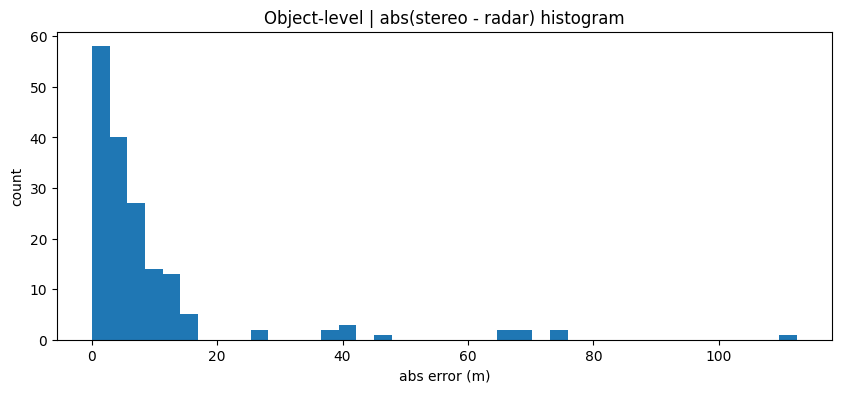

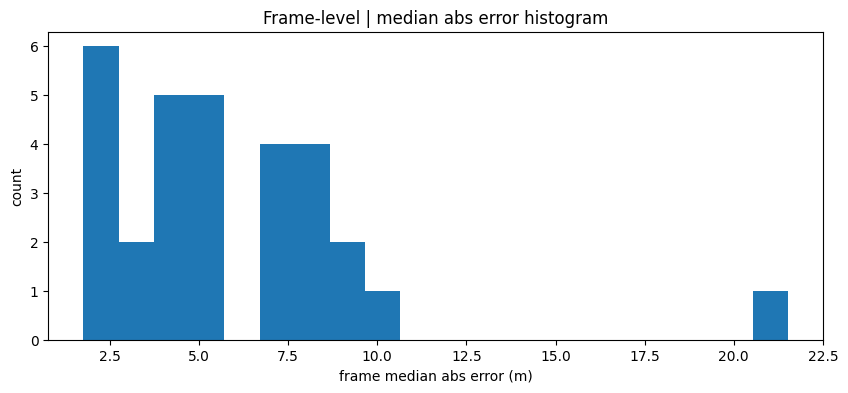


Class stats: (cls, n, median, mean, p90)
('airplane', 1, 0.664312481880188, 0.664312481880188, 0.664312481880188)
('bicycle', 4, 1.3007452487945557, 2.7663140296936035, 6.125115871429443)
('traffic light', 12, 2.2169013023376465, 2.1708085536956787, 3.959439516067505)
('person', 59, 3.3529305458068848, 4.495477676391602, 9.67930793762207)
('truck', 7, 5.1937575340271, 17.800504684448242, 43.91730880737305)
('motorcycle', 1, 6.605096340179443, 6.605096340179443, 6.605096340179443)
('clock', 1, 7.071451187133789, 7.071451187133789, 7.071451187133789)
('car', 81, 7.3105573654174805, 13.803694725036621, 40.50767517089844)
('bus', 6, 7.366922855377197, 14.142319679260254, 32.76342010498047)


In [101]:
# ============================================================
# 오차 분포/통계 시각화 + 클래스별 통계
#          - obj_err: 객체 단위 abs error
#          - frm_med: 프레임 단위 median abs error
#          - histogram으로 분포 확인
#          - 클래스별 median/mean/p90로 어느 클래스가 어려운지 파악
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# (1) 객체 단위 오차 배열 만들기
obj_err = [r["abs_err_m"] for r in all_rows if r.get("abs_err_m") is not None]
obj_err = np.array(obj_err, dtype=np.float32)

# (2) 프레임 단위 median 오차 배열 만들기
frm_med = [f["median_abs_err"] for f in frames if f["median_abs_err"] is not None]
frm_med = np.array(frm_med, dtype=np.float32)

print("Object-level matched count:", int(len(obj_err)))
print("Object-level median abs err (m):", float(np.median(obj_err)) if len(obj_err) else None)
print("Object-level 90% abs err (m):", float(np.quantile(obj_err, 0.9)) if len(obj_err) else None)
print("Object-level max abs err (m):", float(np.max(obj_err)) if len(obj_err) else None)

print("Frame-level median-of-median abs err (m):", float(np.median(frm_med)) if len(frm_med) else None)
print("Frame-level max abs err (m):", float(np.max(frm_med)) if len(frm_med) else None)

# (3) 객체 오차 히스토그램: "개별 객체 기준" 오차 분포
plt.figure(figsize=(10,4))
plt.hist(obj_err, bins=40)
plt.title("Object-level | abs(stereo - radar) histogram")
plt.xlabel("abs error (m)")
plt.ylabel("count")
plt.show()

# (4) 프레임 median 오차 히스토그램: "프레임 기준" 안정성
plt.figure(figsize=(10,4))
plt.hist(frm_med, bins=20)
plt.title("Frame-level | median abs error histogram")
plt.xlabel("frame median abs error (m)")
plt.ylabel("count")
plt.show()

# (5) 클래스별 오차 통계
by_cls = defaultdict(list)
for r in all_rows:
    if r.get("abs_err_m") is None:
        continue
    by_cls[r.get("cls","unknown")].append(r["abs_err_m"])

cls_stats = []
for c, v in by_cls.items():
    v = np.array(v, dtype=np.float32)
    cls_stats.append((c, len(v), float(np.median(v)), float(np.mean(v)), float(np.quantile(v, 0.9))))

# median이 작은 순으로 정렬 → 오차가 작은 클래스부터 보기
cls_stats = sorted(cls_stats, key=lambda x: x[2])

print("\nClass stats: (cls, n, median, mean, p90)")
for row in cls_stats[:15]:
    print(row)

#### 위험 경고 일치율 계산

In [102]:
# ============================================================
# 위험(임계거리) 기준으로 stereo vs radar의 "위험 판단 일치"를 간단히 측정
#          - threshold_m 이하이면 위험(risk=True)로 분류
#          - TP/TN/FP/FN + agree(일치율) 계산
#
#          주의:
#            - 여기서는 "정답(GT)" 없이 stereo와 radar를 서로 비교하는 형태
#            - 즉, agree가 높아도 둘 다 같이 틀릴 수 있음 (정답 기준 성능은 아님)
# ============================================================

def risk_confusion(all_rows, threshold_m=10.0):
    """
    stereo 거리와 radar 거리로 각각 위험 여부를 판단하고,
    두 판단이 얼마나 일치하는지(confusion + agree) 계산

    Args:
        all_rows: compare_stereo_radar(...)로 모은 객체 단위 rows
        threshold_m: 위험 임계 거리(예: 10m 이하면 위험)

    Returns:
        dict: TP/FP/FN/TN, agree, total
    """
    TP=FP=FN=TN=0

    for r in all_rows:
        s = r.get("stereo_m", None)
        d = r.get("radar_m", None)
        if s is None or d is None:
            continue

        s_risk = (s <= threshold_m)
        d_risk = (d <= threshold_m)

        if s_risk and d_risk:
            TP += 1
        elif (not s_risk) and d_risk:
            FP += 1
        elif s_risk and (not d_risk):
            FN += 1
        else:
            TN += 1

    total = TP+FP+FN+TN
    agree = (TP+TN)/total if total else None

    return {"thr_m": threshold_m, "TP":TP, "FP":FP, "FN":FN, "TN":TN, "agree":agree, "total":total}


for thr in [10.0, 5.0]:
    print(risk_confusion(all_rows, threshold_m=thr))

{'thr_m': 10.0, 'TP': 10, 'FP': 1, 'FN': 9, 'TN': 152, 'agree': 0.9418604651162791, 'total': 172}
{'thr_m': 5.0, 'TP': 1, 'FP': 0, 'FN': 7, 'TN': 164, 'agree': 0.9593023255813954, 'total': 172}


#### 최대오차 프레임 자동 저장

In [103]:
# ============================================================
# "최악 프레임" TOPK 저장 (max_abs_err 기준)
#          - frames에서 max_abs_err가 큰 프레임을 골라
#            overlay 이미지로 저장하여 실패 케이스 분석
# ============================================================

import cv2, os

OUT_DIR = "/content/robotcar_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

def draw_dets_with_stereo_radar(img_rgb, dets, min_conf=0.30):
    """
    (재정의) overlay 저장용 간단 버전
    - dets에는 stereo_dist_m, radar_dist_m가 붙어 있어야 함
    """
    img = img_rgb.copy()
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    for d in dets:
        if d.get("conf", 1.0) < min_conf:
            continue

        x1, y1, x2, y2 = map(int, d["xyxy"])
        s = d.get("stereo_dist_m", None)
        r = d.get("radar_dist_m", None)

        cv2.rectangle(bgr, (x1,y1), (x2,y2), (0,255,0), 2)

        s_txt = "N/A" if s is None else f"{s:.1f}m"
        r_txt = "N/A" if r is None else f"{r:.1f}m"
        label = f'{d.get("cls_name","?")} {d.get("conf",0):.2f} | S:{s_txt} R:{r_txt}'

        cv2.putText(
            bgr,
            label,
            (x1, max(0, y1-8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            (0,255,0),
            2
        )

    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)


# max_abs_err가 None인 프레임은 "매칭 객체가 없거나" 오차 계산이 안 된 케이스
cand = [f for f in frames if f["max_abs_err"] is not None]
cand = sorted(cand, key=lambda x: x["max_abs_err"], reverse=True)

TOPK = 8
for i, f in enumerate(cand[:TOPK]):
    vis = draw_dets_with_stereo_radar(f["left_u"], f["dets"], min_conf=0.30)

    # 파일명에 maxerr/timestamp를 넣어 추적 가능하게
    path = os.path.join(
        OUT_DIR,
        f"fail_{i:02d}_maxerr_{f['max_abs_err']:.1f}_tradar_{f['t_radar']}.png"
    )

    # OpenCV는 BGR로 저장하므로 RGB→BGR 변환 필요
    cv2.imwrite(path, cv2.cvtColor(vis, cv2.COLOR_RGB2BGR))
    print("saved:", path)

saved: /content/robotcar_outputs/fail_00_maxerr_112.4_tradar_1547131072120019.png
saved: /content/robotcar_outputs/fail_01_maxerr_74.2_tradar_1547131089358259.png
saved: /content/robotcar_outputs/fail_02_maxerr_73.7_tradar_1547131093867389.png
saved: /content/robotcar_outputs/fail_03_maxerr_67.3_tradar_1547131167113041.png
saved: /content/robotcar_outputs/fail_04_maxerr_46.0_tradar_1547131085112861.png
saved: /content/robotcar_outputs/fail_05_maxerr_41.8_tradar_1547131158624629.png
saved: /content/robotcar_outputs/fail_06_maxerr_40.5_tradar_1547131154122231.png
saved: /content/robotcar_outputs/fail_07_maxerr_38.0_tradar_1547131076358552.png


#### risk level 판단

In [104]:
# ============================================================
# 위험도 분류 (SAFE / WARNING / DANGER) + 보수적 유효거리(effective) 계산
#          - stereo, radar 중 "더 가까운 값"을 effective distance로 사용(보수적)
#          - warn_m / danger_m 임계는 프로젝트 요구사항에 맞춰 조정
# ============================================================

def compute_risk_level(stereo_m, radar_m, warn_m=20.0, danger_m=10.0):
    """
    stereo / radar 거리 기반 위험도 판단

    로직:
      - 둘 중 하나라도 있으면 그 값들 중 최소값(min)을 "effective distance"로 사용
        (더 가까운 센서 값을 신뢰하는 보수적 정책)
      - effective <= danger_m -> DANGER (즉시 제동 수준)
      - effective <= warn_m   -> WARNING (감속/주의 수준)
      - 그 외                -> SAFE
      - 둘 다 없으면 UNKNOWN

    Returns:
        (risk_level(str), effective_dist(float or None))
    """
    dists = [d for d in [stereo_m, radar_m] if d is not None]
    if not dists:
        return "UNKNOWN", None

    eff = min(dists)

    if eff <= danger_m:
        return "DANGER", eff
    elif eff <= warn_m:
        return "WARNING", eff
    else:
        return "SAFE", eff

#### 위험도 + 제어 신호 붙이기

In [105]:
# ============================================================
# dets에 risk/control(가짜 제어 플래그)까지 붙이기
#          - 실제 차량 제어 대신, brake/slow_down boolean으로 신호를 흉내냄
#          - 각 det에:
#              risk_level, effective_dist_m, control{brake, slow_down}
#            을 추가
# ============================================================

def attach_risk_and_control(dets):
    """
    detection 리스트에 위험도 판단과 제어 플래그를 추가합니다.

    Args:
        dets (list[dict]): 각 det에 stereo_dist_m, radar_dist_m가 있을 수 있음

    Returns:
        out (list[dict]): risk_level/effective_dist_m/control 추가된 dets
    """
    out = []
    for d in dets:
        risk, eff_dist = compute_risk_level(
            d.get("stereo_dist_m"),
            d.get("radar_dist_m")
        )

        # 제어 신호 (실차 대신 flag로만 표시)
        control = {
            "brake": False,
            "slow_down": False
        }

        # 위험도에 따른 제어 정책(예시)
        if risk == "DANGER":
            control["brake"] = True
        elif risk == "WARNING":
            control["slow_down"] = True

        dd = dict(d)
        dd["risk_level"] = risk
        dd["effective_dist_m"] = eff_dist
        dd["control"] = control
        out.append(dd)

    return out

#### 시각화: 위험도 색상

In [106]:
# ============================================================
# Risk(위험도) 기반 시각화 함수
#          - dets[*]에 risk_level / effective_dist_m 가 붙어있다고 가정
#          - 위험도에 따라 bbox 색상을 다르게 표시
#          - label에는 "RISK + (유효거리)"를 표기
# ============================================================

import cv2

def draw_dets_with_risk(img_rgb, dets, min_conf=0.30):
    """
    위험도(risk_level) 기반으로 detection 결과를 컬러 박스로 그림

    Args:
        img_rgb (np.ndarray): RGB 이미지 (H,W,3)
        dets (list[dict]): detection list
            - 필수: "xyxy", "conf"
            - 권장: "risk_level", "effective_dist_m"
            - 참고: "stereo_dist_m", "radar_dist_m"
        min_conf (float): 이 값 미만 confidence는 출력에서 제외

    Returns:
        np.ndarray: bbox/label이 그려진 RGB 이미지
    """

    img = img_rgb.copy()
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # OpenCV drawing은 BGR 기준

    # 위험도별 색상(BGR)
    # - SAFE: 초록
    # - WARNING: 주황
    # - DANGER: 빨강
    # - UNKNOWN: 회색
    COLORS = {
        "SAFE": (0, 255, 0),
        "WARNING": (0, 165, 255),
        "DANGER": (0, 0, 255),
        "UNKNOWN": (128, 128, 128)
    }

    for d in dets:
        # --------------------
        # 1) confidence 필터
        # --------------------
        if d.get("conf", 1.0) < min_conf:
            continue

        # --------------------
        # 2) bbox 좌표 + 위험도
        # --------------------
        x1, y1, x2, y2 = map(int, d["xyxy"])

        # risk_level이 없으면 UNKNOWN으로 처리
        risk = d.get("risk_level", "UNKNOWN")

        # 혹시 risk 값이 COLORS에 없으면 UNKNOWN 색으로 fallback (안전장치)
        color = COLORS.get(risk, COLORS["UNKNOWN"])

        # --------------------
        # 3) 거리 정보 (참고용)
        #    - stereo_dist_m / radar_dist_m는 현재 label에 직접 표기하진 않지만,
        #      디버깅/확장 시 사용할 수 있어 미리 꺼내 둠
        # --------------------
        s = d.get("stereo_dist_m")
        r = d.get("radar_dist_m")

        # fusion 결과(보수적으로 min(stereo, radar))로 계산된 유효 거리
        eff = d.get("effective_dist_m")

        # --------------------
        # 4) label 구성: "RISK (effective_dist)"
        # --------------------
        label = f"{risk}"
        if eff is not None:
            label += f" {eff:.1f}m"

        # --------------------
        # 5) bbox + label draw
        # --------------------
        cv2.rectangle(bgr, (x1, y1), (x2, y2), color, 2)

        # y1-8이 화면 밖으로 나가면 0으로 클램프
        cv2.putText(
            bgr, label,
            (x1, max(0, y1 - 8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7,
            color,
            2
        )

    # 다시 RGB로 반환 (matplotlib 표시에 맞춤)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

#### 전체 파이프라인 + 제어 판단

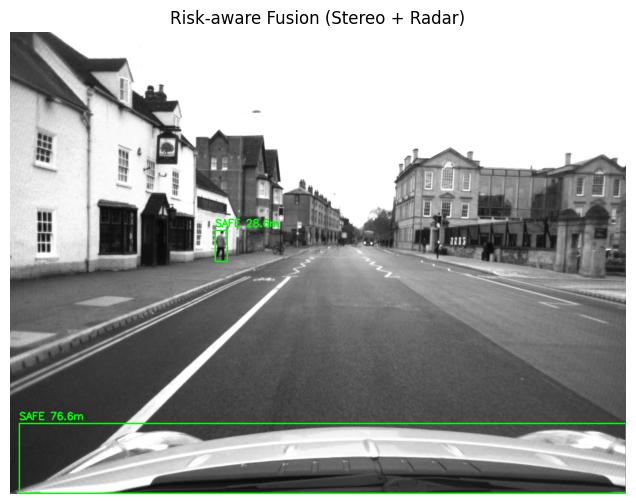

In [107]:
# ============================================================
# Risk attach + 시각화 + 제어 신호 요약 출력
#          - dets는 이미 stereo_dist_m / radar_dist_m 붙은 상태라고 가정
#          - attach_risk_and_control()로 risk_level/effective_dist_m/control을 추가
# ============================================================

import matplotlib.pyplot as plt

dets = attach_risk_and_control(dets)

# 위험도 컬러 박스로 시각화
vis = draw_dets_with_risk(left_u, dets)

plt.figure(figsize=(12,6))
plt.imshow(vis)
plt.title("Risk-aware Fusion (Stereo + Radar)")
plt.axis("off")
plt.show()

# ------------------------------------------------------------
# 제어 신호 요약:
# - WARNING/DANGER만 출력 (SAFE는 너무 많아질 수 있음)
# - control: brake / slow_down 플래그 확인
# ------------------------------------------------------------
for d in dets:
    if d.get("risk_level") in ["WARNING", "DANGER"]:
        print({
            "cls": d.get("cls_name"),
            "risk": d.get("risk_level"),
            "effective_dist_m": d.get("effective_dist_m"),
            "control": d.get("control")
        })

#### 이미지 목록 정렬

In [108]:
# ============================================================
# 저장된 프레임 PNG 목록 확인
#          - 앞에서 fail frame 저장하거나, risk overlay 프레임을 저장해둔 폴더를 기준
#          - glob으로 이미지 파일 리스트를 모아 영상 제작 준비
# ============================================================

import glob
import os

IMG_DIR = "/content/robotcar_outputs"
img_paths = sorted(glob.glob(os.path.join(IMG_DIR, "*.png")))

print("Number of frames:", len(img_paths))
print("First 5:")
for p in img_paths[:5]:
    print(os.path.basename(p))

Number of frames: 8
First 5:
fail_00_maxerr_112.4_tradar_1547131072120019.png
fail_01_maxerr_74.2_tradar_1547131089358259.png
fail_02_maxerr_73.7_tradar_1547131093867389.png
fail_03_maxerr_67.3_tradar_1547131167113041.png
fail_04_maxerr_46.0_tradar_1547131085112861.png


#### 영상으로 만들기 (mp4)

In [109]:
# ============================================================
# 이미지 시퀀스(.png) → mp4 영상으로 합치기
#          - OpenCV VideoWriter 사용
#          - 첫 프레임으로 영상 해상도(w,h) 결정
#          - 프레임마다 크기 다르면 resize로 통일
# ============================================================

import cv2

# 출력 비디오 설정
out_path = "/content/robotcar_risk_demo.mp4"
fps = 5  # 5~10 추천: 프레임이 너무 빠르면 시각적 확인이 어려움
fourcc = cv2.VideoWriter_fourcc(*"mp4v")

# ------------------------------------------------------------
# 1) 첫 프레임으로 해상도 결정 (VideoWriter는 고정 해상도가 필요)
# ------------------------------------------------------------
first = cv2.imread(img_paths[0])
if first is None:
    raise FileNotFoundError(f"First image not found or cannot be read: {img_paths[0]}")

h, w, _ = first.shape

# (w, h) 순서 주의!
writer = cv2.VideoWriter(out_path, fourcc, fps, (w, h))

# ------------------------------------------------------------
# 2) 모든 이미지 프레임을 순서대로 write
# ------------------------------------------------------------
for p in img_paths:
    img = cv2.imread(p)
    if img is None:
        # 특정 파일이 깨졌거나 없을 때 skip
        continue

    # 해상도 통일 (영상은 프레임 크기가 반드시 동일해야 함)
    if img.shape[:2] != (h, w):
        img = cv2.resize(img, (w, h))

    writer.write(img)

# ------------------------------------------------------------
# 3) 반드시 release() 호출해서 파일이 정상 저장되도록 함
# ------------------------------------------------------------
writer.release()

print("Saved video:", out_path)

Saved video: /content/robotcar_risk_demo.mp4


#### 재생

In [110]:
from IPython.display import Video

Video(out_path, embed=True)

In [111]:
import os
out_path = "/content/robotcar_risk_demo.mp4"
print("exists:", os.path.exists(out_path))
print("size(bytes):", os.path.getsize(out_path) if os.path.exists(out_path) else None)

exists: True
size(bytes): 1906929


In [112]:
import os, glob, shutil

IMG_DIR = "/content/robotcar_outputs"
tmp_dir = "/content/tmp_frames"
os.makedirs(tmp_dir, exist_ok=True)

img_paths = sorted(glob.glob(os.path.join(IMG_DIR, "*.png")))
print("frames:", len(img_paths))

# tmp_frames/frame_0000.png ... 로 복사
for i, p in enumerate(img_paths):
    dst = os.path.join(tmp_dir, f"frame_{i:04d}.png")
    shutil.copy(p, dst)

print("example:", os.path.join(tmp_dir, "frame_0000.png"))

frames: 8
example: /content/tmp_frames/frame_0000.png


In [113]:
out_path = "/content/robotcar_risk_demo.mp4"
fps = 5

!ffmpeg -y -framerate {fps} -i /content/tmp_frames/frame_%04d.png \
  -c:v libx264 -pix_fmt yuv420p -movflags +faststart {out_path}

!ls -lh {out_path}

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [114]:
from IPython.display import Video
Video(out_path, embed=True)

#### 30프레임 전체 저장 + 영상 만들기

In [115]:
import os, numpy as np, cv2
from tqdm import tqdm

OUT_FRAMES_DIR = "/content/robotcar_outputs/all_frames"
os.makedirs(OUT_FRAMES_DIR, exist_ok=True)

def sample_timestamps(ts_list, n=30):
    if len(ts_list) <= n:
        return ts_list
    idxs = np.linspace(0, len(ts_list)-1, n).astype(int)
    return [ts_list[i] for i in idxs]

# 1) 타임스탬프 샘플링 (radar 기준)
radar_ts = load_timestamps(os.path.join(DATA_ROOT, "radar.timestamps"))
radar_ts_s = sample_timestamps(radar_ts, n=30)

print("Saving frames:", len(radar_ts_s), "->", OUT_FRAMES_DIR)

for i, t0 in enumerate(tqdm(radar_ts_s)):
    frame = get_frame(DATA_ROOT, int(t0))

    # stereo undistort + depth
    left_rgb  = frame["left_img"]
    right_rgb = frame["right_img"]
    left_u  = model_left.undistort(left_rgb)
    right_u = model_right.undistort(right_rgb)

    disp  = compute_disparity_sgbm(left_u, right_u)
    depth = disparity_to_depth(disp, fx, BASELINE_M)

    # detection
    dets = detect_objects({"left_img": left_u, "right_img": right_u},
                          conf=0.25, iou=0.45, max_det=50, use_img="left")
    dets = [d for d in dets if d.get("conf", 1.0) >= 0.30]

    # attach stereo + radar
    dets = attach_stereo_range_to_dets(dets, depth)

    radar_polar = load_radar_polar(DATA_ROOT, frame["t_radar"])
    img_h, img_w = left_u.shape[:2]
    fx_local, cx_local = get_fx_and_cx(model_left, img_w)
    dets = attach_radar_range_to_dets(dets, radar_polar, fx_local, cx_local)

    # risk + visualization
    dets = attach_risk_and_control(dets)
    vis = draw_dets_with_risk(left_u, dets)

    # 프레임 상단에 타임스탬프 오버레이
    bgr = cv2.cvtColor(vis, cv2.COLOR_RGB2BGR)
    cv2.putText(bgr, f"idx={i:02d}  t_radar={frame['t_radar']}",
                (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,255,255), 2)

    save_path = os.path.join(OUT_FRAMES_DIR, f"frame_{i:04d}.png")
    cv2.imwrite(save_path, bgr)

print("Done. Example:", os.path.join(OUT_FRAMES_DIR, "frame_0000.png"))


Saving frames: 30 -> /content/robotcar_outputs/all_frames


100%|██████████| 30/30 [00:37<00:00,  1.24s/it]

Done. Example: /content/robotcar_outputs/all_frames/frame_0000.png


In [116]:
out_path = "/content/robotcar_risk_demo_all30.mp4"
fps = 5  # 주행 느낌: 8~12, 분석 느낌: 4~6

!ffmpeg -y -framerate {fps} -i /content/robotcar_outputs/all_frames/frame_%04d.png \
  -c:v libx264 -pix_fmt yuv420p -movflags +faststart {out_path}

!ls -lh {out_path}

from IPython.display import Video
Video(out_path, embed=True)

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab